# **Project Name**    -Netflix Movies and tv shows clustering



##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual(Mahesh Kumar Godara)

# **Project Summary -**


Netflix is a popular subscription-based online platform for streaming movies and TV shows. To keep users interested, Netflix relies on recommendation systems to provide valuable content suggestions. In this project, we analyze Netflix data to uncover trends and insights using a dataset collected from Flixable, a third-party Netflix search engine. The data reveals a significant increase in TV shows and a decrease in movies since 2010. By implementing clustering models like K-means and Agglomerative Clustering, we build a recommendation system that suggests content based on user preferences. The project includes data exploration, null value treatment, and text pre-processing for natural language processing (NLP). Despite the data's size and potential irrelevance, we successfully perform exploratory data analysis (EDA) and draw important conclusions to address relevant business challenges.

# **GitHub Link -**

https://github.com/Mahesh9003

# **Problem Statement**


**The vast collection of movies and TV shows available on Netflix poses a challenge in effectively organizing and categorizing the content. To address this issue, we aim to develop an unsupervised machine learning model for clustering Netflix movies and TV shows. The objective is to group similar content together based on shared characteristics such as genre, director, cast, release year, and ratings. By clustering the content, we can provide Netflix users with enhanced browsing and recommendation experiences, allowing them to easily discover new content that aligns with their preferences. The challenge lies in identifying the optimal clustering algorithm and features that effectively capture the underlying patterns and relationships in the dataset. Additionally, the model should be scalable and adaptable to accommodate the continuous addition of new content to Netflix's library. The successful development of such a model would greatly improve content organization and recommendation systems, leading to increased user satisfaction and engagement on the Netflix platform.**

# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import pyplot as plt
from numpy import math
import matplotlib.cm as cm
%matplotlib inline
import matplotlib.ticker as mtick
from matplotlib.pyplot import figure
import plotly.graph_objects as go
import plotly.offline as py
import plotly.express as px
from datetime import datetime
# Sklearn Libraries
from sklearn import preprocessing
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, KFold
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import PassiveAggressiveClassifier
# NLP Libraries
import nltk
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer

import warnings
warnings.filterwarnings('ignore')


### Dataset Loading

In [ ]:
# Load Dataset
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
path = '/content/drive/MyDrive/Colab/Machine Learning/netflix movies and tv shows clustering/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv'
df = pd.read_csv(path)

### Dataset First View

In [ ]:
# Dataset First Look
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
df_rows=len(df.axes[0])
df_columns=len(df.axes[1])
print('Number of rows :',df_rows)
print('Number of columns :',df_columns)

Number of rows : 7787
Number of columns : 12


### Dataset Information

In [ ]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
df.duplicated().sum()

0

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
df.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

<Axes: >

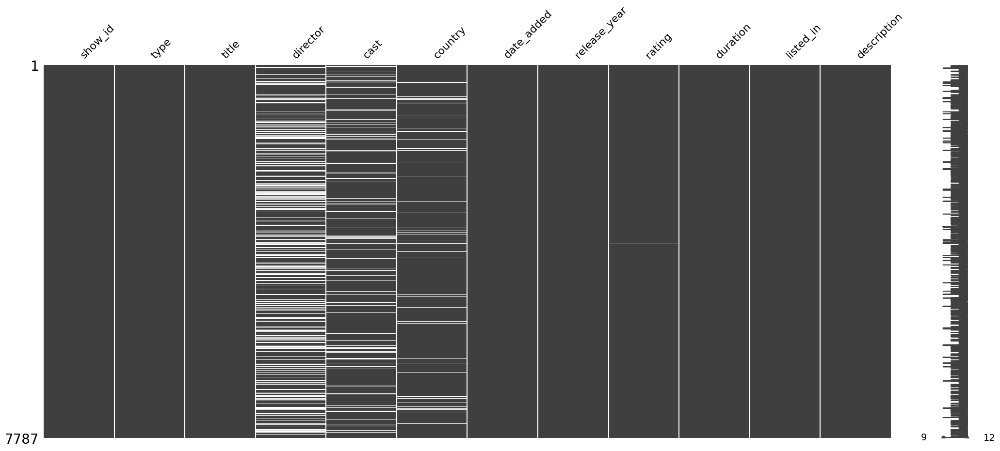

In [ ]:
# Visualizing the missing values
import missingno as msno
msno.matrix(df)

### What did you know about your dataset?

* In our dataset there are 7787 rows and 12 columns.
* Null values are present in director, cast, country, date_added, and rating.
* No duplicate values exist.



## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
# Dataset Describe
df.describe(include = 'all')

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,7787,7787,7787,5398,7069,7280,7777,7787.000000,7780,7787,7787,7787
unique,7787,2,7787,4049,6831,681,1565,NaN,14,216,492,7769
top,s1,Movie,3%,"Raúl Campos, Jan Suter",David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,Documentaries,Multiple women report their husbands as missin...
freq,1,5377,1,18,18,2555,118,NaN,2863,1608,334,3
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.932580,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.757395,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018.000000,NaN,NaN,NaN,NaN


### Variables Description

show_id : Unique ID for every Movie or Tv Show

type :This variable indicates whether the entry is a movie or a TV show. It acts as an identifier to distinguish between the two types of content.

title : Title of the Movie or Tv Show

director : Director of the Movie

cast :  actors involved in the movie or TV show

country : Country where the movie or show was produced

date_added :date when the movie or TV show was added to the Netflix platform

release_year : Actual Releaseyear of the movie or show

rating : TV Rating of the movie or show

duration : Total Duration  in minutes or number of seasons

listed_in : The listed_in variable denotes the genre or category of the movie or TV show.

description: A brief summary or description of the movie or TV show.

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
df.nunique()

show_id         7787
type               2
title           7787
director        4049
cast            6831
country          681
date_added      1565
release_year      73
rating            14
duration         216
listed_in        492
description     7769
dtype: int64

## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# Creating a copy of original dataset to keep it safe
df_new1 = df.copy()

In [ ]:
# Impute missing values in 'country' column with the most frequent country
most_frequent_country = df['country'].mode()[0]
df['country'].fillna(most_frequent_country, inplace=True)

# Removing the rows with missing values in the 'date_added' and 'rating' columns
df.dropna(subset=['date_added','rating'],inplace=True)

# The missing values in the 'cast' column replaced with the label 'Unknown'
df['cast']= df['cast'].fillna('Unknown')

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

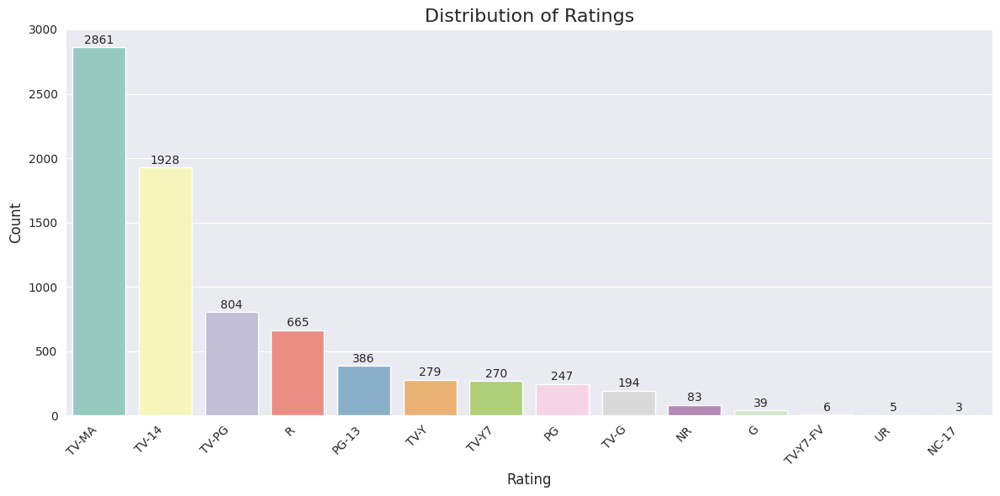

In [ ]:
# Ratings of Movies and TV shows

# Count the frequency of each rating value
rating_counts = df['rating'].value_counts()

# Create a bar plot
plt.figure(figsize=(12, 6))
sns.set_style("darkgrid")
ax = sns.barplot(x=rating_counts.index, y=rating_counts.values, palette="Set3")

# Customize the plot
plt.title("Distribution of Ratings", fontsize=16)
plt.xlabel("Rating", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(rotation=45, ha='right')

# Add value labels to the bars
for i, count in enumerate(rating_counts.values):
    ax.text(i, count+10, str(count), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

This is a bar plot. bar plot is suitable for visualizing the distribution of categorical data, such as the ratings in this case.
 Bar plots are commonly used to represent and compare the frequency or count of different categories.

##### 2. What is/are the insight(s) found from the chart?

 The most of common ratings for  movies and TV shows on Netflix are TV-MA and TV-14.

#### Chart - 2

In [ ]:
 type_of_content = df['type'].value_counts().reset_index()
 type_of_content.columns=['type','count']
 type_of_content

,type,count
0,Movie,5372
1,TV Show,2398


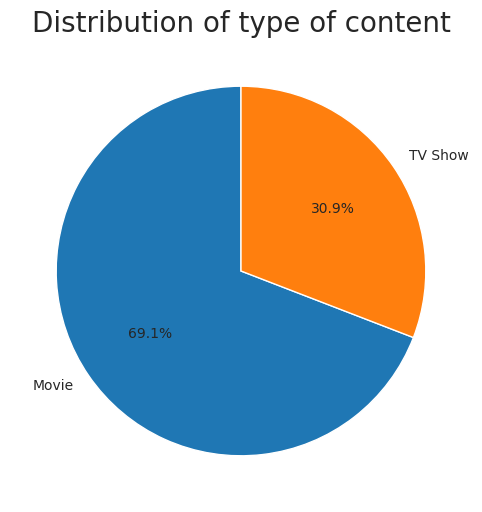

In [ ]:
#Distribution of type of content on Netflix
plt.figure(figsize=(10, 6))
ax = plt.subplot()
# Calculate the Distribution of type of content on Netflix
proportions =  type_of_content['count'] /  type_of_content['count'].sum()
# Create the pie chart
ax.pie(proportions, labels= type_of_content['type'], autopct='%1.1f%%', startangle=90)
ax.set_title('Distribution of type of content', fontsize=20)
plt.show()

##### 1. Why did you pick the specific chart?

This is a pie chart It is chosen to represent the Distribution of type of content on Netflix in the dataset.

##### 2. What is/are the insight(s) found from the chart?

Almost 70% of datapoints belong to Movie, rest 30% to TV Show

#### Chart - 3

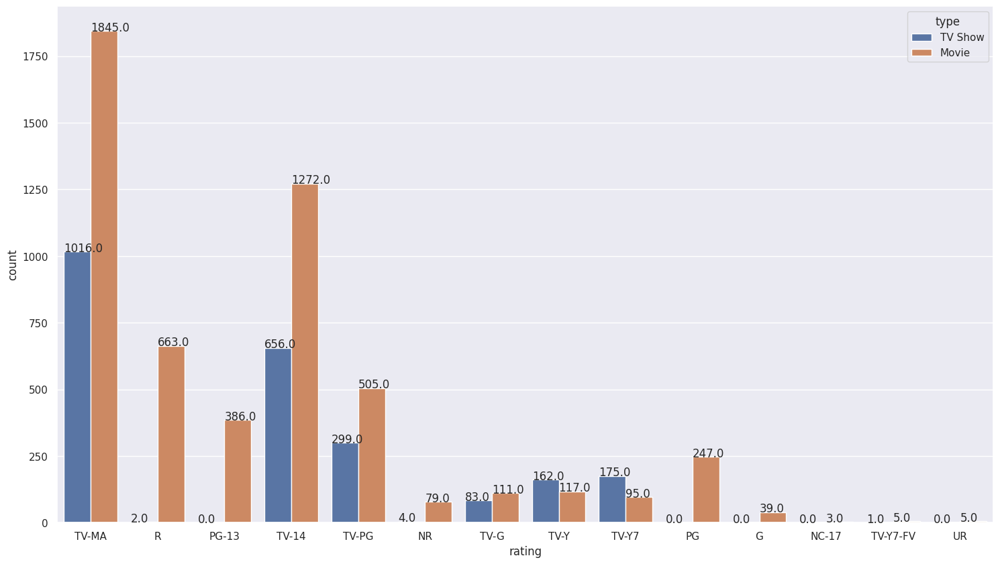

In [ ]:
 # Type of shows and their ratings

sns.set(rc={'figure.figsize':(18,10)})
# Creating a countplot using seaborn, with 'rating' on the x-axis and 'type' as the hue
ax = sns.countplot(data = df, x = 'rating', hue = 'type',)
for p in ax.patches:
   ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x(), p.get_height()+0.01))

##### 1. Why did you pick the specific chart?

This is a countplot with 'rating' on the x-axis and 'type' as the hue, was chosen to visualize the distribution of ratings for different types of shows (movies and TV shows) on Netflix.

##### 2. What is/are the insight(s) found from the chart?

In Netflix's content library, TV-MA (Mature Audience) shows dominate, followed by TV-14 (14+) and TV-PG (Parental Guidance) shows, indicating a preference for mature and older audience content. Interestingly, there are currently no TV shows on Netflix with ratings such as PG-13, PG, G, UR, etc.

#### Chart - 4

In [ ]:
#number of uniquevalues in dirrector column
df.director.nunique()

4047

In [ ]:
#let's check which category have maximum nulls in director column
missing_df = df[df['director'].isna()]

# Count the number of missing values in 'director' column for each category
missing_counts = missing_df['type'].value_counts()

# Print the number of missing values for each category
print("Number of missing values in 'director' column for TV shows:", missing_counts['TV Show'])
print("Number of missing values in 'director' column for movies:", missing_counts['Movie'])


Number of missing values in 'director' column for TV shows: 2214
Number of missing values in 'director' column for movies: 162


Most of the missing columns of directors are for TV Shows

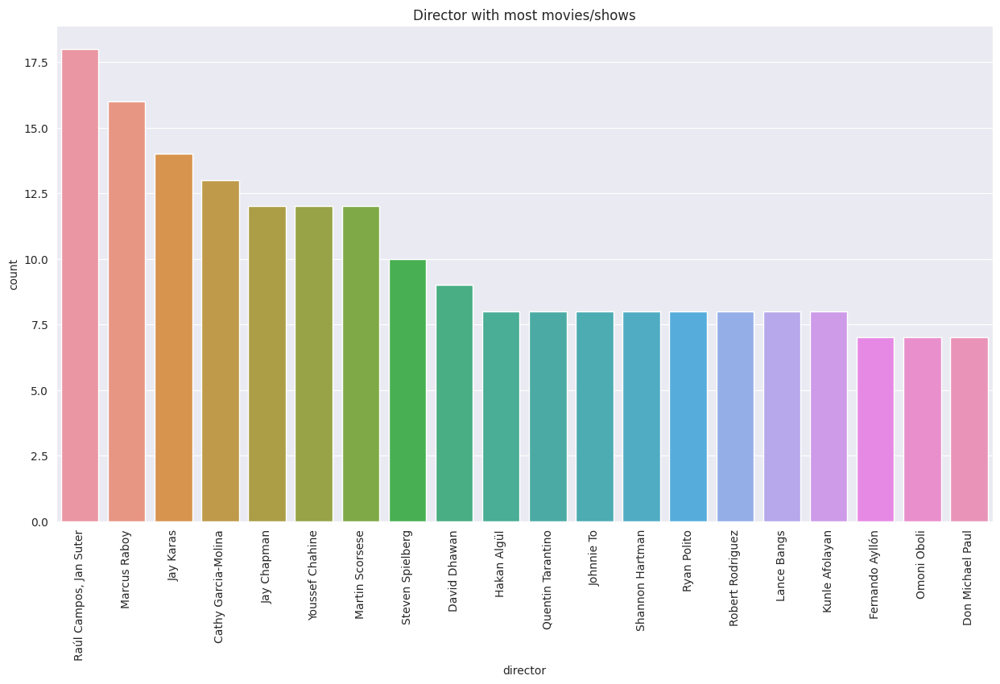

In [ ]:
#Top 20 Directors with most number of Movies/Shows on Netflix
plt.figure(figsize = (15,8))
sns.countplot(x='director',data=df,order=df.director.value_counts().head(20).index)
plt.title('Director with most movies/shows')
plt.xticks(rotation = 90)
plt.show()


##### 1. Why did you pick the specific chart?

The specific chart used is a countplot because it effectively displays the number of movies/shows associated with each director. The countplot is suitable for categorical data and allows us to easily visualize and compare the number of movies/shows directed by each individual.

##### 2. What is/are the insight(s) found from the chart?

The top director by the number of shows directed is Raul Campos, Jan Suter who directed 18 shows in the dataset.

The second most popular director is Marcus Raboy, who directed 16 shows.


#### Chart - 5

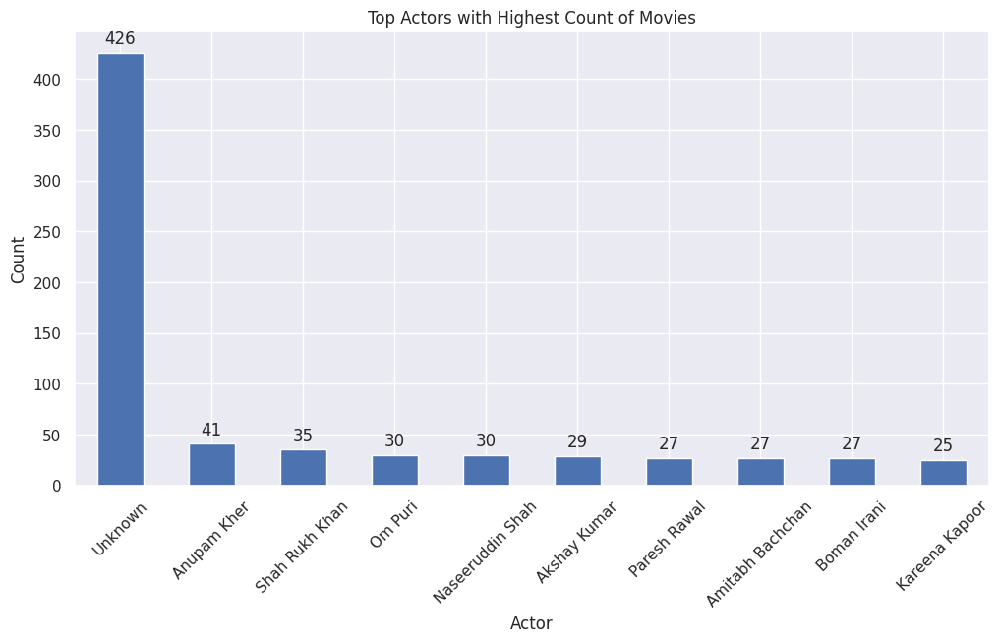

In [ ]:
#Top Actors with highest count of Movies and Tv shows

# Group the data by 'cast' and count the number of movies for each actor
actor_movie_counts = df[df['type'] == 'Movie']['cast'].str.split(', ').explode().value_counts()

# Select the top 10 actors with the highest count of movies
top_actors = actor_movie_counts.head(10)

# Create a bar plot to visualize the top actors with counts
plt.figure(figsize=(12, 6))
top_actors.plot(kind='bar')
plt.title('Top Actors with Highest Count of Movies')
plt.xlabel('Actor')
plt.ylabel('Count')
plt.xticks(rotation=45)

# Add value labels to the bars
for i, count in enumerate(top_actors):
    plt.text(i, count + 5, str(count), ha='center', va='bottom')

plt.show()


##### 1. Why did you pick the specific chart?

This is a Bar chart that displays the top 10 actors by the number of shows they appeared in on Netflix. This chart is an appropriate choice for analyzing the relationship between actors and the number of shows they appeared in on Netflix.

##### 2. What is/are the insight(s) found from the chart?

The top actor by the number of shows they appeared in is Anupam Kher, who appeared in 41 shows in the dataset.

The second most popular actor is Shah Rukh Khan, who appeared in 35 shows.

#### Chart - 6

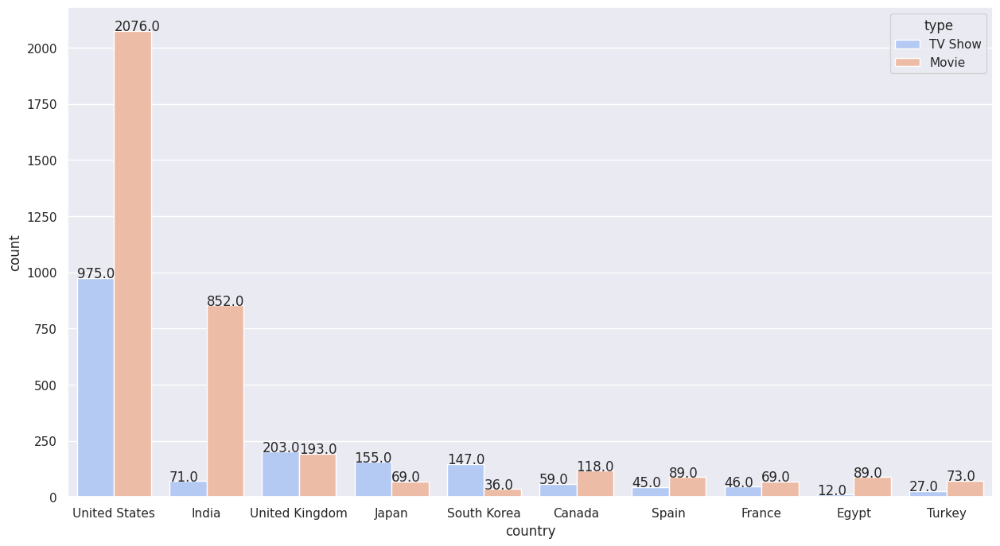

In [ ]:
#Country wise distribution of Movies and Tv shows

# figure size for the plot
sns.set(rc={'figure.figsize':(15,8)})
#countplot using seaborn
ax = sns.countplot(data = df, x='country',palette="coolwarm",order=df['country'].value_counts().index[0:10],hue='type', )
for p in ax.patches:
   ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x(), p.get_height()+0.01))

##### 1. Why did you pick the specific chart?

The specific chart chosen is a countplot because it effectively illustrates the country-wise distribution of movies and TV shows on Netflix. The countplot is suitable for visualizing the frequency of categorical data, in this case, the number of movies and TV shows produced in each country.

##### 2. What is/are the insight(s) found from the chart?

The countplot reveals that Netflix has a large number of movies and TV shows from the United States. India comes in second place, but it has a different distribution between movies and TV shows. There are more movies from India compared to TV shows.

#### Chart - 7

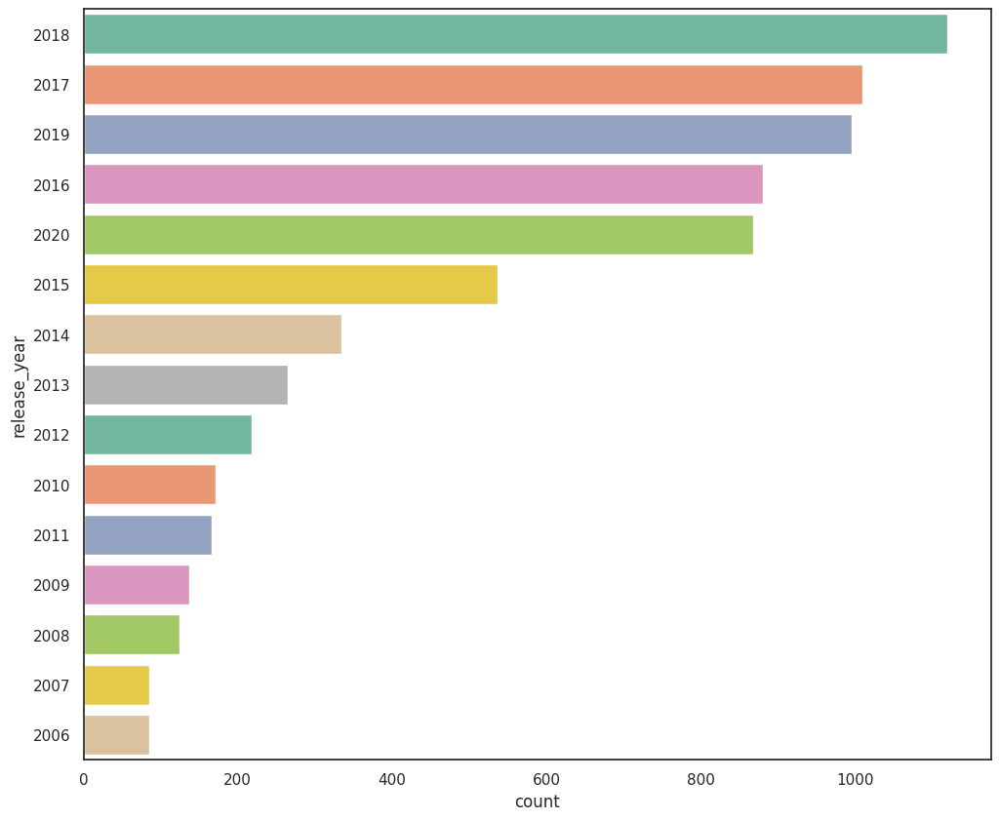

In [ ]:
# Count plot for releases over years
plt.figure(figsize=(12,10))
sns.set(style="white")
ax = sns.countplot(y="release_year", data=df, palette="Set2", order=df['release_year'].value_counts().index[0:15])

#### Chart - 8

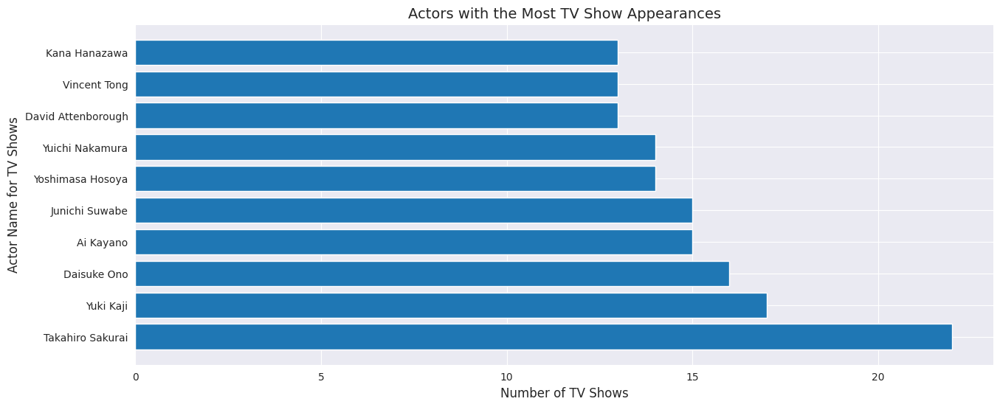

In [ ]:
# Actors with the Most TV Show Appearances

tv_shows = df[(df['type'] == 'TV Show') & ~(df['cast'] == 'Unknown')]

# Counting the number of TV shows each actor has appeared in
actor_counts = tv_shows['cast'].str.split(', ').explode().value_counts()
top_actors = actor_counts.head(10)
plt.figure(figsize=(15, 6))
plt.barh(top_actors.index, top_actors.values)
plt.xlabel('Number of TV Shows', fontsize=12)
plt.ylabel('Actor Name for TV Shows', fontsize=12)
plt.title('Actors with the Most TV Show Appearances', fontsize=14)
plt.show()

##### 1. Why did you pick the specific chart?

This is a horizontal bar plot. This chart could be useful for understanding which actors are most frequently cast in TV shows.

##### 2. What is/are the insight(s) found from the chart?

The chart shows the top 10 actors who have appeared in the most TV shows on Netflix. The insight gained from the chart is that Takahiro Sakurai has appeared in the most TV shows on Netflix, followed by Yuki kaji and Daisuke Ono.

#### Chart - 9

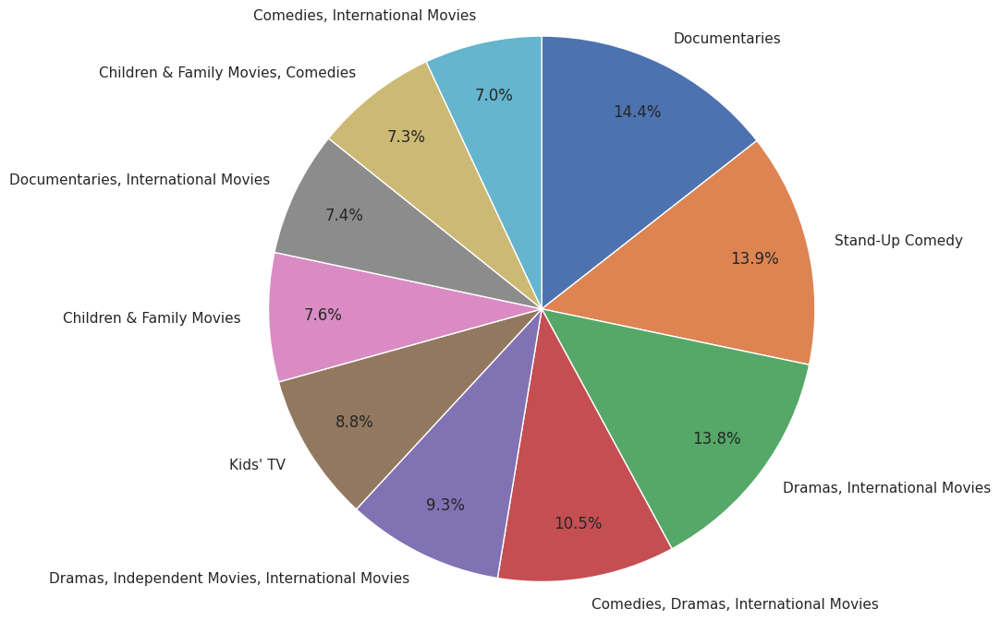

In [ ]:
#Top 10 Genres
top_genres = df["listed_in"].value_counts().head(10)
plt.figure(figsize=(8,8))
plt.pie(top_genres, labels=top_genres.index, autopct='%1.1f%%', pctdistance=0.8, labeldistance=1.1,radius=1.2, startangle=90, counterclock=False)
plt.show()


#### Chart - 10

In [ ]:
# Changing the values in the rating column
# Create a dictionary to map the current ratings to new ratings
rating_map = {'TV-MA':'Adults',
'R':'Adults',
'PG-13':'Teens',
'TV-14':'Young Adults',
'TV-PG':'Older Kids',
'NR':'Adults',
'TV-G':'Kids',
'TV-Y':'Kids',
'TV-Y7':'Older Kids',
'PG':'Older Kids',
'G':'Kids',
'NC-17':'Adults',
'TV-Y7-FV':'Older Kids',
'UR':'Adults'}
# Replace the current ratings with the new ratings using the mapping dictionary
df['rating'].replace(rating_map,inplace=True)

In [ ]:
# unique values in the 'rating' column
print(df['rating'].unique())

['Adults' 'Teens' 'Young Adults' 'Older Kids' 'Kids']


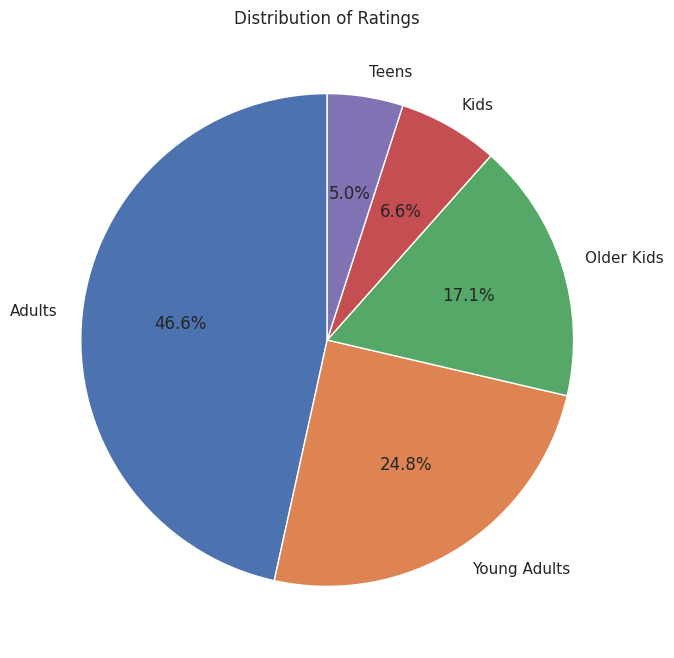

In [ ]:
# Rating distribution
df_rating = df['rating'].value_counts()
plt.figure(figsize=(8,8))
plt.pie(df_rating.values, labels=df_rating.index,autopct='%1.1f%%',startangle=90)
plt.title('Distribution of Ratings')
plt.show()

#### Chart - 11

In [ ]:
#Convert timestamp to datetime format to fetch the other details
df["date_added"] = pd.to_datetime(df['date_added'])

#addding new column to dataframe such as 'month_added'and 'year_added' to gain more insights from the data
df['year_added'] = df['date_added'].dt.year
df['month_added'] = df['date_added'].dt.month

In [ ]:
df_month_added = df['month_added'].value_counts()
df_month_added

12    832
10    785
1     756
11    738
3     668
9     618
8     617
7     600
4     600
5     543
6     542
2     471
Name: month_added, dtype: int64

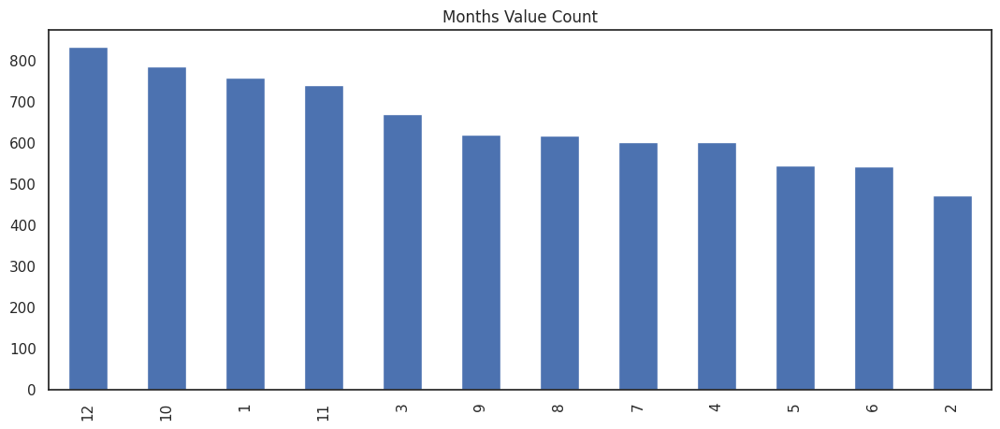

In [ ]:
# Content added by Month
plt.title('Months Value Count')
df_month_added.plot(kind='bar', figsize=(13,5))
plt.show()

#### Chart - 12

In [ ]:
# yearly content release by content type
df1 = df[df["type"] == "TV Show"]
df2 = df[df["type"] == "Movie"]

temp_df1 = df1['release_year'].value_counts().reset_index()
temp_df2 = df2['release_year'].value_counts().reset_index()


# create trace1
trace1 = go.Bar(
                x = temp_df1['index'],
                y = temp_df1['release_year'],
                name="TV Shows",
                marker = dict(color = 'rgb(255, 165, 0)'))
# create trace2
trace2 = go.Bar(
                x = temp_df2['index'],
                y = temp_df2['release_year'],
                name = "Movies",
                marker = dict(color = 'rgb(238, 130, 238)'))


layout = go.Layout(template= "plotly_dark",title = 'YEARLY CONTENT RELEASE BY CONTENT TYPE' , xaxis = dict(title = 'Year'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1, trace2], layout = layout)
fig.show(renderer='colab')

#### Chart - 13

In [ ]:
#Number of Shows Released Each Year
df.release_year.value_counts()

2018    1120
2017    1010
2019     996
2016     881
2020     868
        ... 
1925       1
1964       1
1966       1
1947       1
1959       1
Name: release_year, Length: 73, dtype: int64

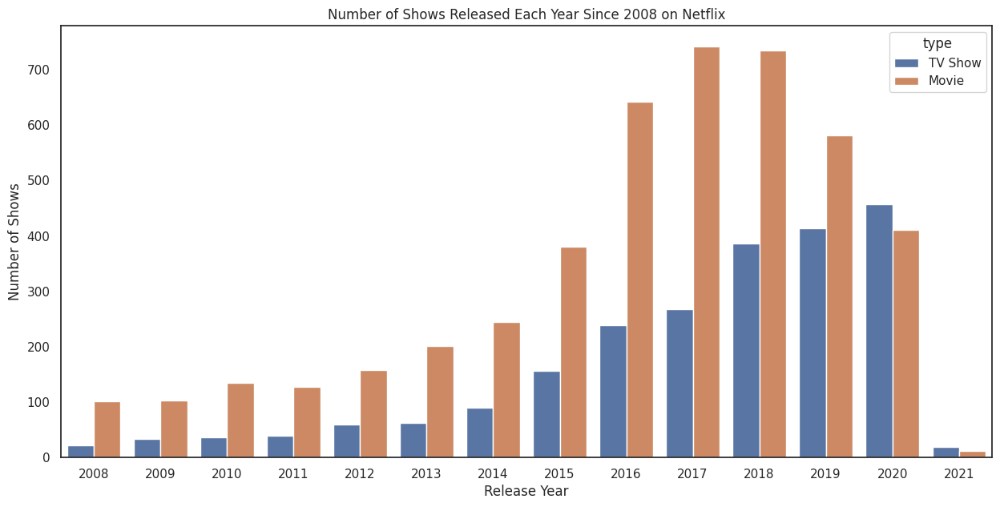

In [ ]:
#Number of Shows Released Each Year  on Netflix
filtered_df = df[df['release_year'] >= 2008]
plt.figure(figsize=(15, 7))
sns.countplot(x='release_year', data=filtered_df, hue='type', order=range(2008, 2022))
plt.xlabel('Release Year')
plt.ylabel('Number of Shows')
plt.title('Number of Shows Released Each Year Since 2008 on Netflix')
plt.show()

#### Chart-14

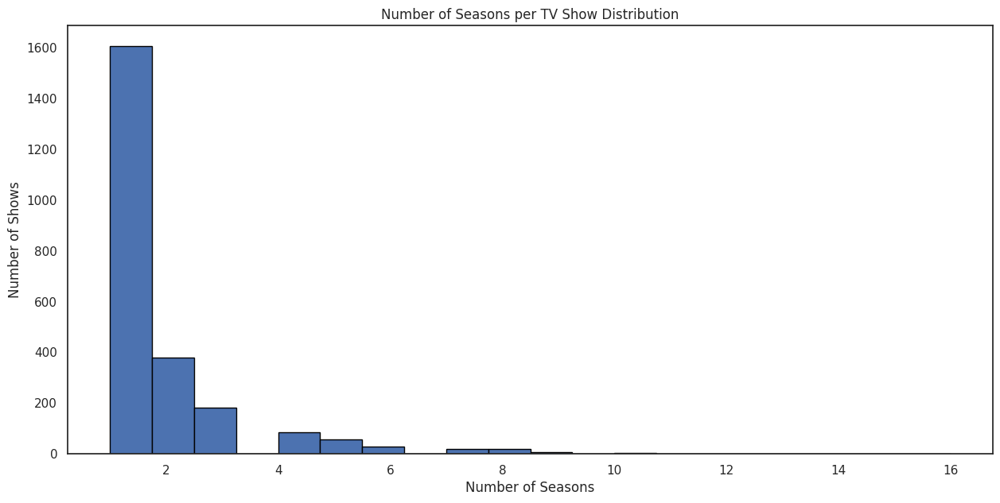

In [ ]:
#Number of Seasons per TV Show Distribution

# converts the values in the 'duration' column of the DataFrame to integers.
df['duration'] = df['duration'].apply(lambda x: int(x.split()[0]))

tv_shows = df[df['type'] == 'TV Show']
plt.figure(figsize=(15, 7))
plt.hist(tv_shows['duration'], bins=20, edgecolor='black')
plt.xlabel('Number of Seasons', fontsize=12)
plt.ylabel('Number of Shows', fontsize=12)
plt.title('Number of Seasons per TV Show Distribution')
plt.show()



The majority of TV shows have one to three seasons.

#### Chart - 15

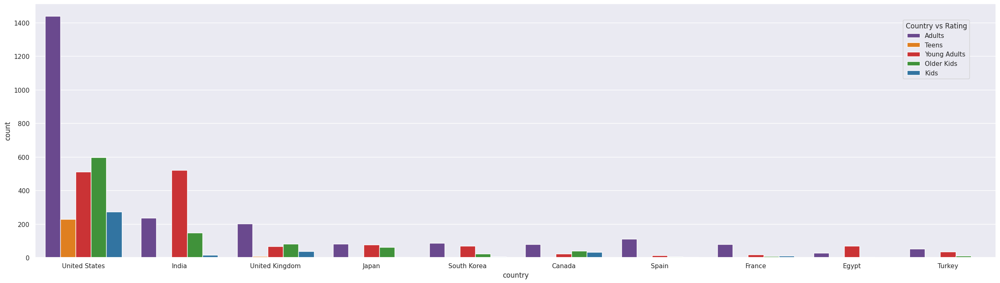

In [ ]:
#Country wise distribution of content
sns.set(rc={'figure.figsize':(30,8)})
g = sns.countplot(data = df, x='country',palette="Paired_r",order=df['country'].value_counts().index[0:10],hue = 'rating', )
sns.move_legend(g, "upper left", bbox_to_anchor=(.90, .95), title='Country vs Rating')

#### Chart - 16 - Correlation Heatmap

Most of the columns in the provided Netflix Movies and TV shows dataset are of object data type (textual information), it may not be appropriate or meaningful to perform a correlation heatmap directly on this dataset. These visualizations are typically used for exploring relationships between numeric variables.

#### Chart - 17 - Pair Plot

Most of the columns in the provided Netflix Movies and TV shows dataset are of object data type (textual information), it may not be appropriate or meaningful to perform a pair plot on this dataset. These visualizations are typically used for exploring relationships between numeric variables.

## ***5. Hypothesis Testing***

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

**Null Hypothesis (H0):** There is no significant difference in the distribution of ratings between movies and TV shows on Netflix.

**Alternative Hypothesis (H1):** There is a significant difference in the distribution of ratings between movies and TV shows on Netflix.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
import scipy.stats as stats

# Create a contingency table
contingency_table = pd.crosstab(df['type'], df['rating'])

# Perform chi-square contingency analysis
chi2, p_value, _, _ = stats.chi2_contingency(contingency_table)

# Print the p-value
print("The p-value for the chi-square contingency test is:", p_value)


The p-value for the chi-square contingency test is: 8.708717484839124e-59


The p value is smaller than significance level ,So, we will reject the null hypothesis and accept the alternative hypothesis.

##### Which statistical test have you done to obtain P-Value?

the statistical test used to obtain the p-value is the chi-square contingency analysis. The chi-square contingency test is a statistical test used to determine whether there is a significant association between two categorical variables.

##### Why did you choose the specific statistical test?

The specific statistical test chosen, the chi-square contingency analysis, is appropriate for examining the association between the two categorical variables of interest: 'type' (movies or TV shows) and 'rating' on Netflix. This test allows us to assess whether the distribution of ratings is dependent on the type of content (movies or TV shows) on Netflix.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

**Null Hypothesis (H0):** There is no significant difference in the release year distribution between movies and TV shows on Netflix.

**Alternative Hypothesis (H1):** There is a significant difference in the release year distribution between movies and TV shows on Netflix.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
import scipy.stats as stats

movies = df[df['type'] == 'Movie']['release_year']
tv_shows = df[df['type'] == 'TV Show']['release_year']

# Perform Mann-Whitney U test
statistic, p_value = stats.mannwhitneyu(movies, tv_shows)

# Print the p-value
print("The p-value for the Mann-Whitney U test is:", p_value)

The p-value for the Mann-Whitney U test is: 1.8772186034373436e-89


The p-value is significantly smaller than the chosen significance level Therefore, we reject the null hypothesis and accept the alternative hypothesis.

##### Which statistical test have you done to obtain P-Value?

In this case, the statistical test used to obtain the p-value is the Mann-Whitney U test (also known as the Wilcoxon rank-sum test). The Mann-Whitney U test is a non-parametric test used to compare the distributions of two independent groups when the data does not follow a normal distribution.

##### Why did you choose the specific statistical test?

The Mann-Whitney U test was chosen because it is suitable for comparing the distribution of release years between movies and TV shows on Netflix. This test does not assume a specific distribution for the data and is robust to violations of normality assumptions. It is appropriate when the data is ordinal or when the assumptions of parametric tests like the t-test cannot be met.


## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation
# we already converted missing values in 'country' column with the most frequent country
# Removed the rows with missing values in the 'date_added' and 'rating' columns
# The missing values in the 'cast' column replaced with the label 'Unknown'

In [ ]:
# Verify that all missing values have been handled
missing_values_count = df.isnull().sum()
print(missing_values_count)

show_id            0
type               0
title              0
director        2376
cast               0
country            0
date_added         0
release_year       0
rating             0
duration           0
listed_in          0
description        0
year_added         0
month_added        0
dtype: int64


In [ ]:
# Step 1: Calculate the number of missing values in the 'director' column
missing_director = df['director'].isnull().sum()

# Step 2: Divide the number of missing values by the total number of rows
total_rows = df.shape[0]
percentage_missing = (missing_director / total_rows) * 100

# Step 3: Print the percentage of missing values
print(f"The percentage of missing values in the 'director' column is: {percentage_missing:.2f}%")


The percentage of missing values in the 'director' column is: 30.58%


So we have 2376 missing values in director column.this is a high percentage of missing values (30.58%), it may not provide much meaningful information or could introduce bias if used in analyses. so in this case, dropping the 'director'column might be a reasonable option.

In [ ]:
# Drop the 'director' column from the DataFrame
df.drop(columns=['director'], inplace=True)

In [ ]:
# Verify that all missing values have been handled
missing_values_count = df.isnull().sum()
print(missing_values_count)

show_id         0
type            0
title           0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
year_added      0
month_added     0
dtype: int64


#### What all missing value imputation techniques have you used and why did you use those techniques?

*  We replaced the null values in the "country" column with the mode
*  We dropped the null values in the "date_added" and "rating" columns because the number of missing values was relatively very small.
*  We filled the null values in the "cast" column with "unknown" because different movies can have varying numbers of cast members, and this allows us to indicate that there is no specific information available for those missing values.

### 2. Handling Outliers

Our column data types in the dataset are in string format, it is not possible to identify outliers.so, we can assume that there are no outliers in the dataset.

### 3. Categorical Encoding

We cannot do categorical encoding using the dataset columns because they are all in string format, and categorical encoding require numerical data.

### 4. Textual Data Preprocessing
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

#### 1.Feature Selection

In [ ]:
data = df[['title']]
data['Filtered_data'] = (df['description'] + ' ' + df['listed_in'] + ' '+ df['cast'] + ' ' + df['country'] + ' ' + df['rating']).astype(str)
data.set_index('title', inplace = True)
data.head(5)

,Filtered_data
title,
3%,In a future where the elite inhabit an island ...
7:19,After a devastating earthquake hits Mexico Cit...
23:59,"When an army recruit is found dead, his fellow..."
9,"In a postapocalyptic world, rag-doll robots hi..."
21,A brilliant group of students become card-coun...


#### 2. Removing Punctuations

In [ ]:
# Creating function to remove all the punctuations
def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # Let's replace the punctuations with no space,
    translator = str.maketrans('', '', string.punctuation)
    return text.translate(translator)

In [ ]:
data['Filtered_data'] = data['Filtered_data'].apply(remove_punctuation)
data.head(5)

,Filtered_data
title,
3%,In a future where the elite inhabit an island ...
7:19,After a devastating earthquake hits Mexico Cit...
23:59,When an army recruit is found dead his fellow ...
9,In a postapocalyptic world ragdoll robots hide...
21,A brilliant group of students become cardcount...


#### 3. Removing Stopwords & Removing White spaces


In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
# extracting the stopwords using nltk library
sw = nltk.corpus.stopwords.words('english')
# Let's see all stopwords
np.array(sw)

array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [ ]:
print("Counts of stopwords: ", len(sw))

Counts of stopwords:  179


In [ ]:
def stopwords(text):
    '''a function for removing the stopword'''
    # removing the stop words and lowercasing the selected words
    text = [word.lower() for word in text.split() if word.lower() not in sw]
    # joining the list of words with space separator
    return " ".join(text)

In [ ]:
data['Filtered_data'] = data['Filtered_data'].apply(stopwords)
data.head(8)

,Filtered_data
title,
3%,future elite inhabit island paradise far crowd...
7:19,devastating earthquake hits mexico city trappe...
23:59,army recruit found dead fellow soldiers forced...
9,postapocalyptic world ragdoll robots hide fear...
21,brilliant group students become cardcounting e...
46,genetics professor experiments treatment comat...
122,awful accident couple admitted grisly hospital...
187,one high school students attacks dedicated tea...


### 4. Tokenization

In [ ]:
# creating a count vectorizer object
count_vectorizer = CountVectorizer()
# fit the count vectorizer using the text data
count_vectorizer.fit(data['Filtered_data'])
# collect the vocabulary items used in the vectorizer
dictionary = count_vectorizer.vocabulary_.items()

In [ ]:
# lists to store the vocab and counts
vocab = []
count = []
# iterate through each vocab and count append the value to designated lists
for key, value in dictionary:
    vocab.append(key)
    count.append(value)
# store the count in panadas dataframe with vocab as index
vocab_bef_stem = pd.Series(count, index=vocab)
# sort the dataframe
vocab_before_stem = vocab_bef_stem.sort_values(ascending=False)

<Axes: >

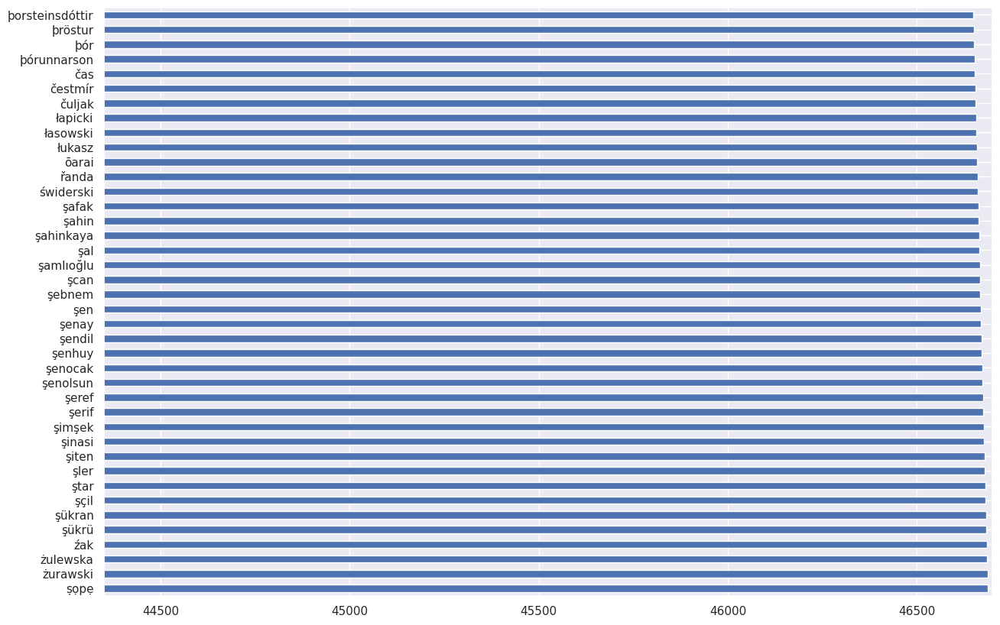

In [ ]:
top_vocab = vocab_before_stem.head(40)
top_vocab.plot(kind = 'barh', figsize = (15,10),xlim = (44350, 46700))

<Axes: >

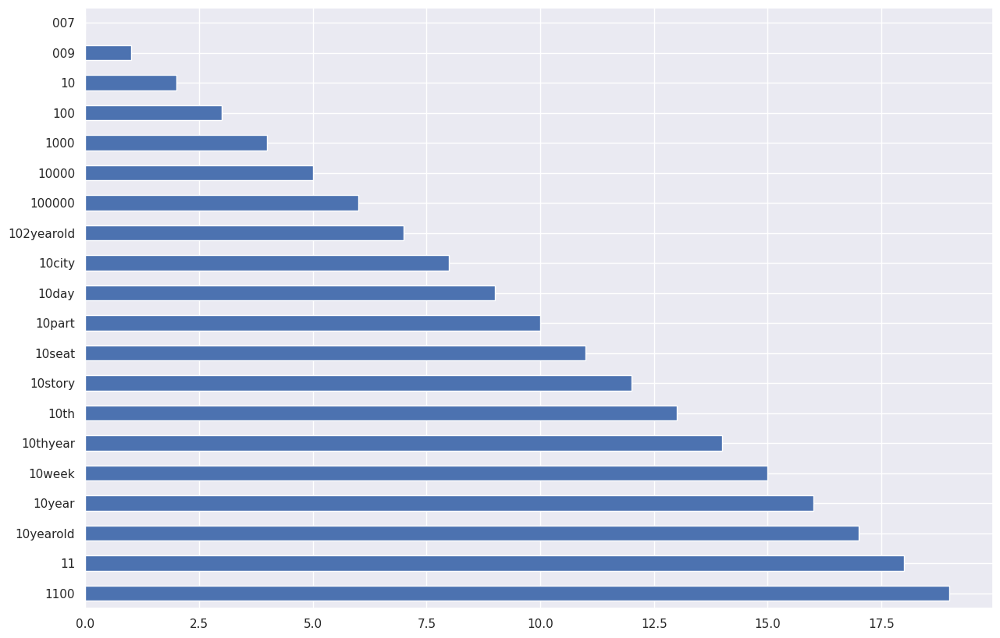

In [ ]:
top_vacab = vocab_before_stem.tail(20)
top_vacab.plot(kind = 'barh', figsize = (15,10),)

### 5. Stemming using the SnowballStemmer

In [ ]:
# creating an object of stemming function
stemmer = SnowballStemmer("english")

def stemming(text):
    '''a function which stems each word in the given text'''
    text = [stemmer.stem(word) for word in text.split()]
    return " ".join(text)

In [ ]:
data['Filtered_data'] = data['Filtered_data'].apply(stemming)
data.head(5)

,Filtered_data
title,
3%,futur elit inhabit island paradis far crowd sl...
7:19,devast earthquak hit mexico citi trap survivor...
23:59,armi recruit found dead fellow soldier forc co...
9,postapocalypt world ragdol robot hide fear dan...
21,brilliant group student becom cardcount expert...


Stemming is a natural language processing technique used to reduce words to their root or base form. The main goal of stemming is to normalize words so that different forms of the same word are treated as a single entity.

The "SnowballStemmer"  is particularly popular for its support of multiple languages. The SnowballStemmer can handle various languages by providing different stemmer classes, each customized for a specific language.

In Python, the SnowballStemmer is available as part of the Natural Language Toolkit (NLTK) library, which is commonly used for text processing and natural language processing tasks. To use the SnowballStemmer in Python, you would typically do the following:

### 6. Text Vectorization

In [ ]:
# creating the object of tfid vectorizer
tfid_vectorizer = TfidfVectorizer()

# fiting the vectorizer using text data
tfid_vectorizer.fit(data['Filtered_data'])

# Let's collect the vocabulary items used in the vectorizer
dictionary = tfid_vectorizer.vocabulary_.items()

<Axes: >

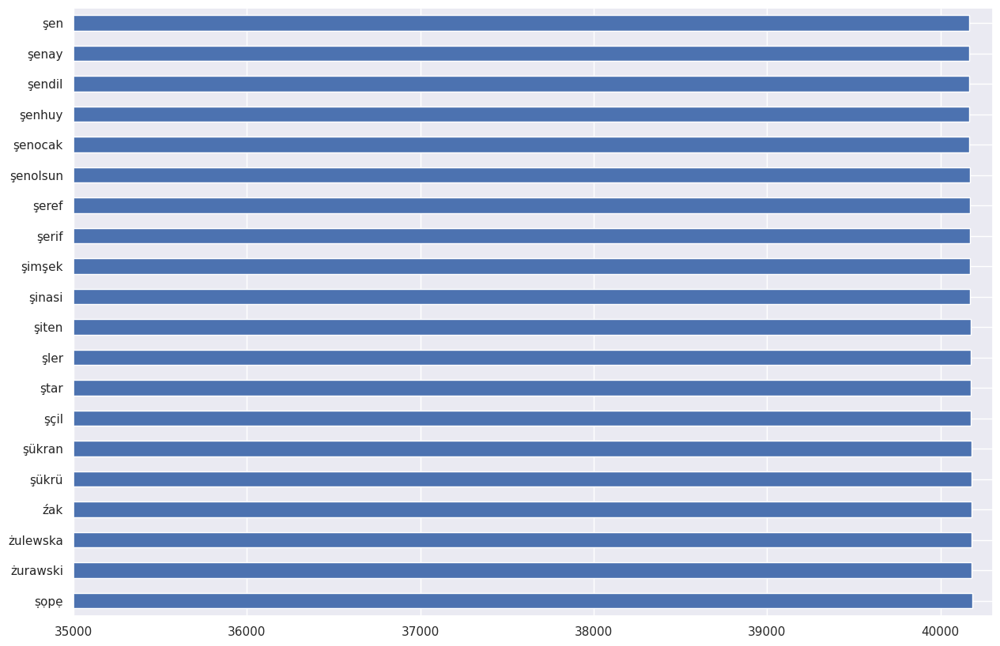

In [ ]:
# lists to store the vocab and counts
vocab = []
count = []
# iterate through each vocab and count append the value to designated lists
for key, value in dictionary:
    vocab.append(key)
    count.append(value)
# store the count in panadas dataframe with vocab as index
vocab_after_stem = pd.Series(count, index=vocab)
# sort the dataframe
vocab_after_stem = vocab_after_stem.sort_values(ascending=False)
# plot of the top vocab
top_vacab = vocab_after_stem.head(20)
top_vacab.plot(kind = 'barh', figsize=(15,10),xlim = (35000, 40300))


#### 7. Lower Casing

In [ ]:
# converting the "Filtered_data" column to lowercase using a lambda function
data['Filtered_data']= data['Filtered_data'].apply(lambda x: x.lower())

#### 8. Length of features

In [ ]:
# This function returns the length of the text
def length(text):
    '''a function which returns the length of text'''
    return len(text)

In [ ]:
data['length_of_text'] = data['Filtered_data'].apply(length)
data.head(5)

,Filtered_data,length_of_text
title,,
3%,futur elit inhabit island paradis far crowd sl...,294
7:19,devast earthquak hit mexico citi trap survivor...,203
23:59,armi recruit found dead fellow soldier forc co...,241
9,postapocalypt world ragdol robot hide fear dan...,277
21,brilliant group student becom cardcount expert...,267


#### 9. Data Transformation

In [ ]:
X =data.Filtered_data

In [ ]:
# Tranforming the data
t_vectorizer = TfidfVectorizer(max_features=20000)
X= t_vectorizer.fit_transform(X)

In [ ]:
# shape of the vectorized data
print(X.shape)

(7770, 20000)


#### 10. Dimesionality Reduction

In [ ]:
# Here we are reducing the components of X values to the principal component axes that explain 95% of the variance in order to improve efficiency.
from sklearn.decomposition import PCA
pca_tuned = PCA(n_components=0.95)
pca_tuned.fit(X.toarray())
X_transformed = pca_tuned.transform(X.toarray())
X_transformed.shape


(7770, 5571)

We applied Principal Component Analysis (PCA) as the technique for dimensionality reduction. PCA helps to compress or summarize the original data by identifying the most important features and creating new variables, known as principal components, that capture the essential information of the dataset.

## ***7. ML Model Implementation***

# 1. Elbow Method for K-means

Text(0, 0.5, 'WCSS')

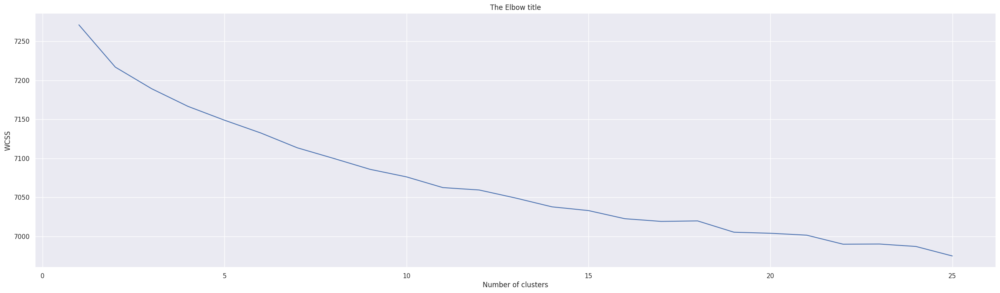

In [ ]:
# Importing the K-means
from sklearn.cluster import KMeans
# List to store the within-cluster sum of squares
wcss=[]
# Here we are iterating over different numbers of clusters
for i in range(1,26):
  kmeans = KMeans(i)
  kmeans.fit(X_transformed)
  wcss_iter = kmeans.inertia_
  wcss.append(wcss_iter)
# Here we are plotting the WCSS values against the number of clusters
number_clusters = range(1,26)
plt.plot(number_clusters,wcss)
plt.title('The Elbow title')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

The Elbow graph analysis revealed the optimal number of clusters, which is 18 in this case. We identified this number by examining the point on the graph where there is a clear bend or substantial deviation from a straight line. This turning point on the x-axis signifies the value representing the number of clusters.

#2. Silhouette Score for K-means

For n_clusters = 2 The average silhouette_score is : 0.004946398488711627
For n_clusters = 3 The average silhouette_score is : 0.005705138347395033
For n_clusters = 4 The average silhouette_score is : 0.006571787452394802
For n_clusters = 5 The average silhouette_score is : 0.007444262169630967
For n_clusters = 6 The average silhouette_score is : 0.004309609082332411
For n_clusters = 7 The average silhouette_score is : 0.004846984740194296
For n_clusters = 8 The average silhouette_score is : 0.00825205500325672
For n_clusters = 9 The average silhouette_score is : 0.005481975050058809
For n_clusters = 10 The average silhouette_score is : 0.009089839135848923
For n_clusters = 11 The average silhouette_score is : 0.0066033561750879705
For n_clusters = 12 The average silhouette_score is : 0.005595256611747004
For n_clusters = 13 The average silhouette_score is : 0.006929970963139643
For n_clusters = 14 The average silhouette_score is : 0.0060205243505249756
For n_clusters = 15 The average 

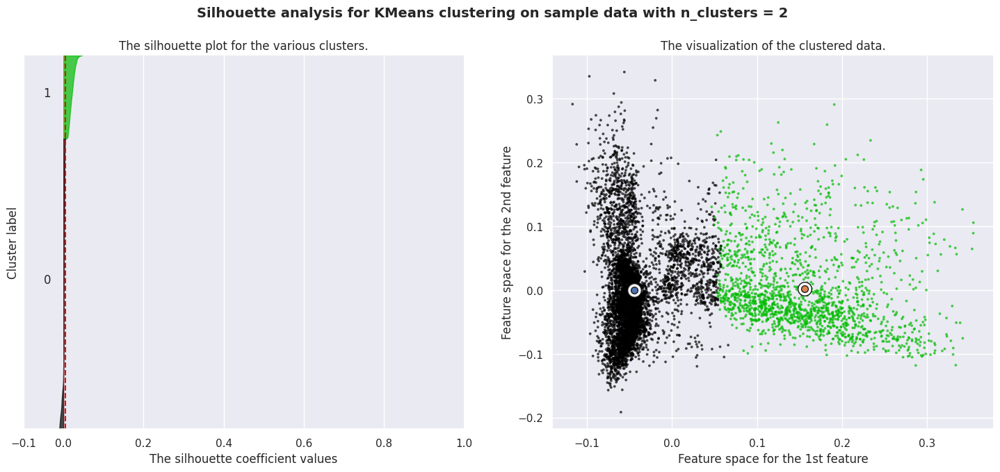

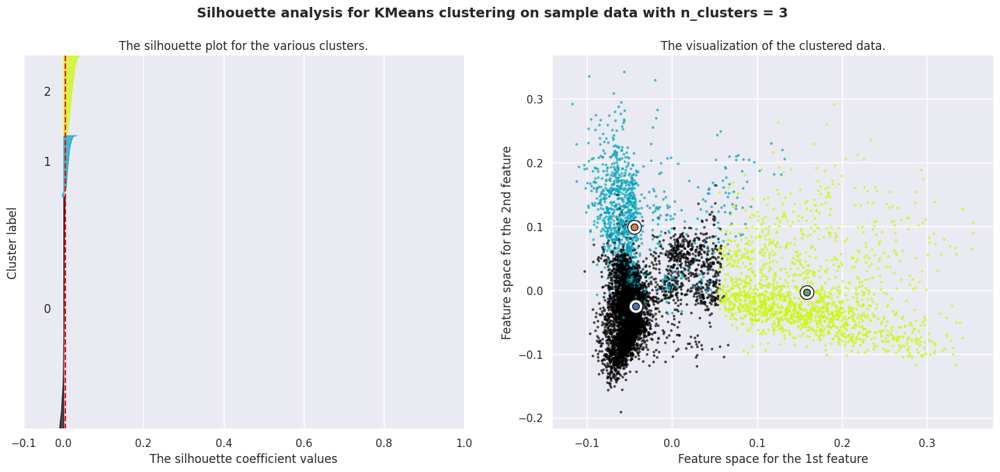

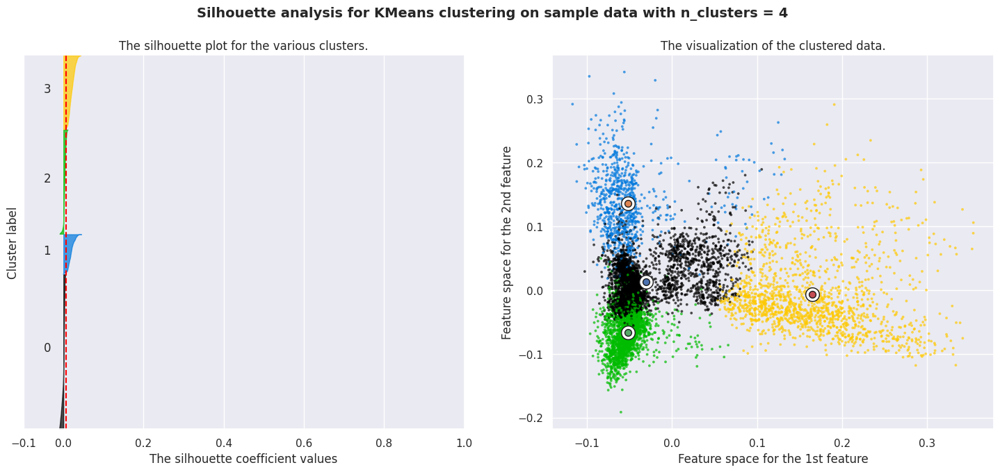

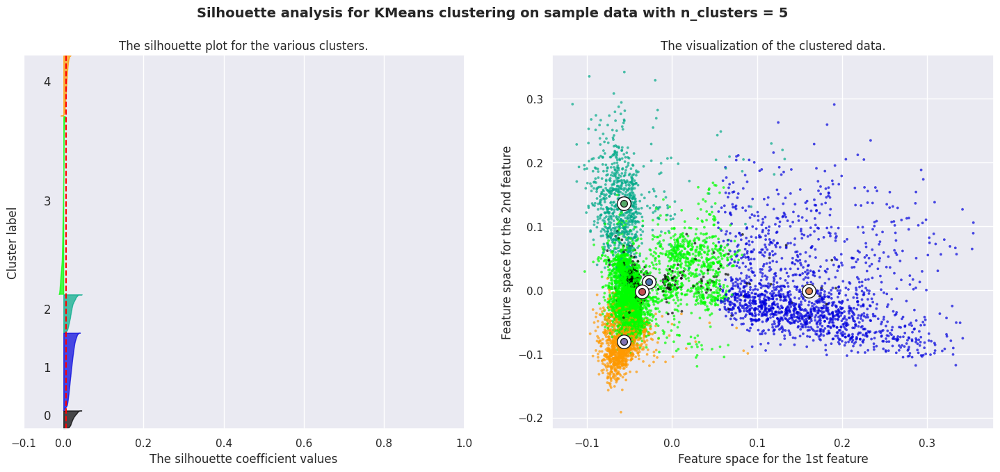

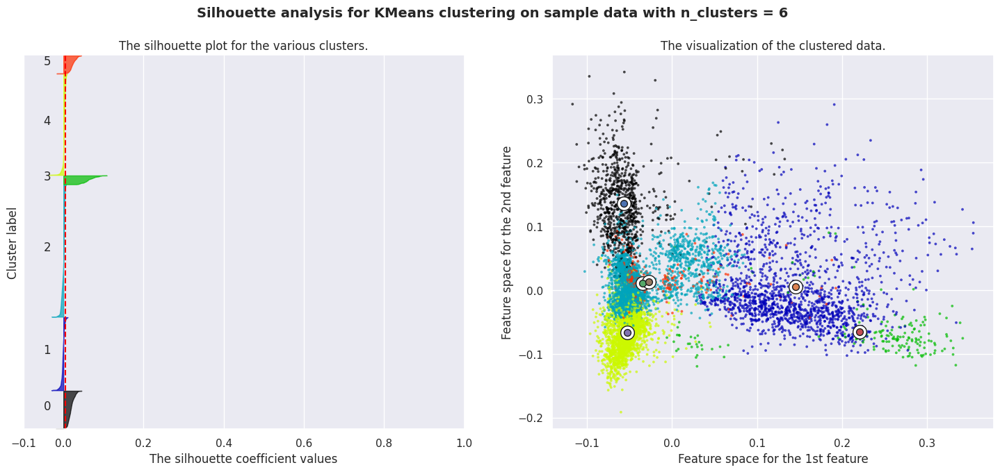

...

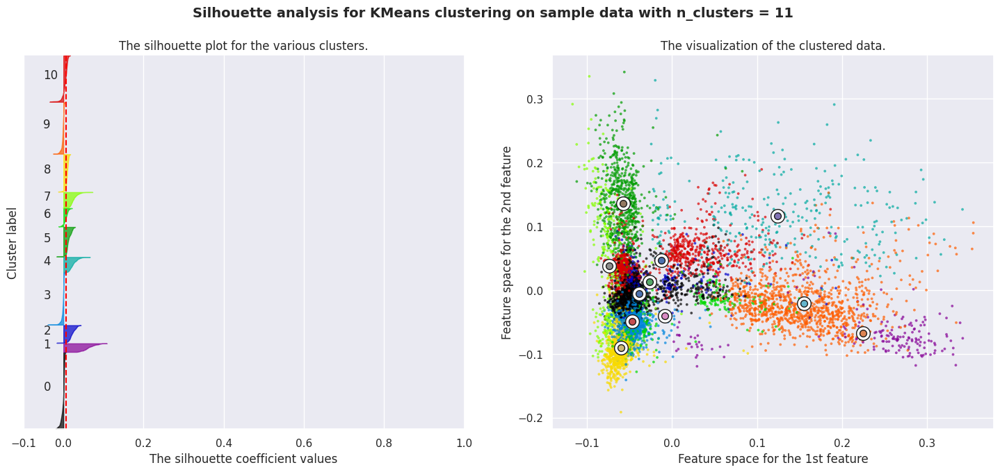

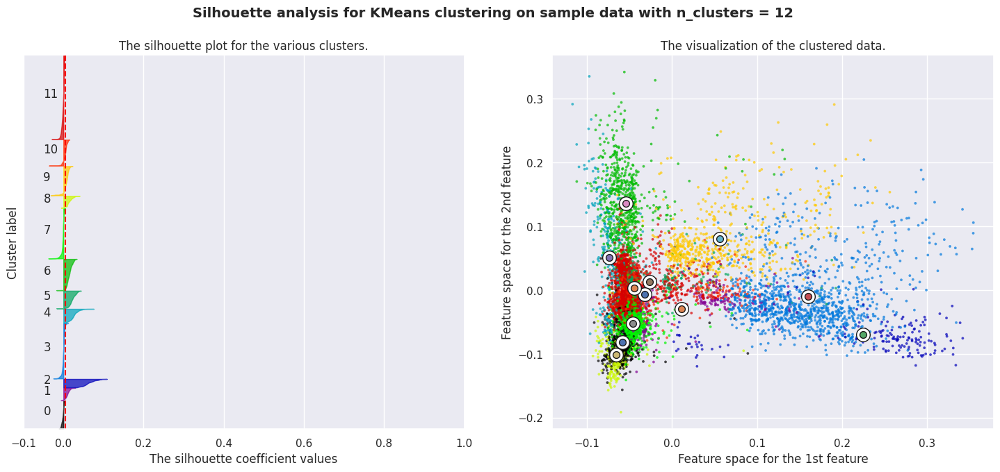

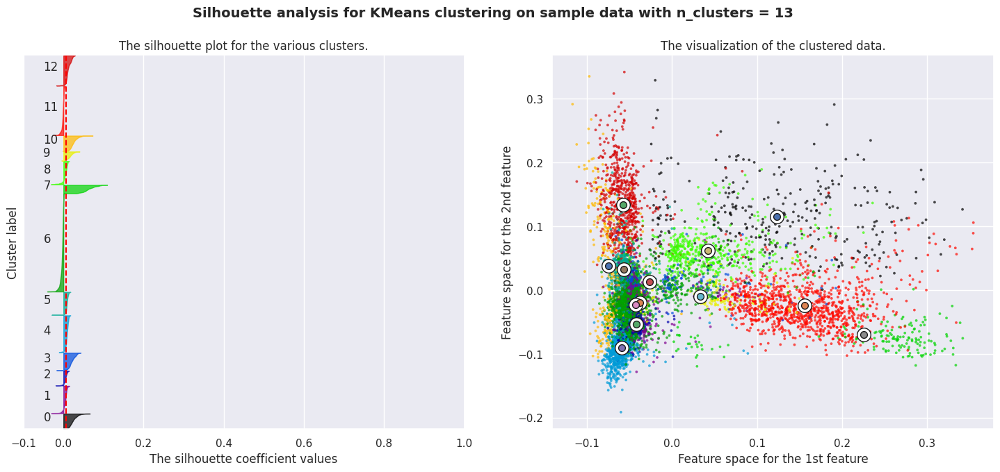

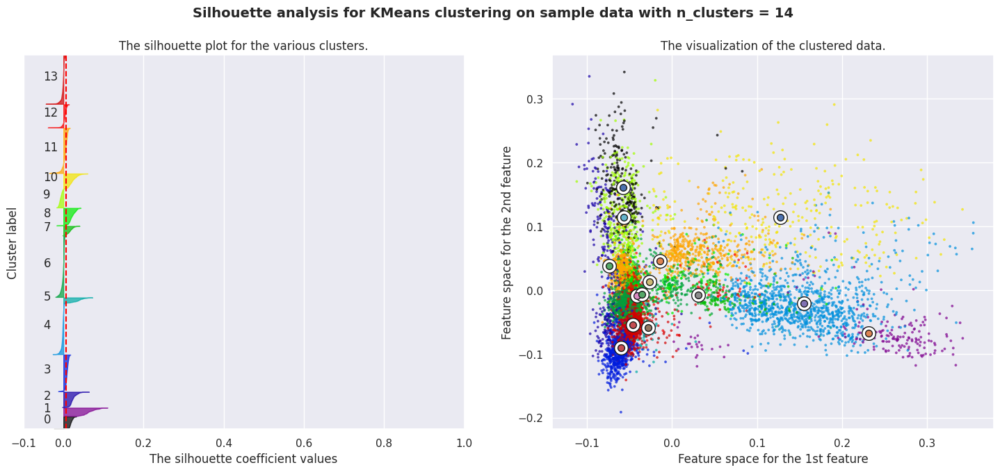

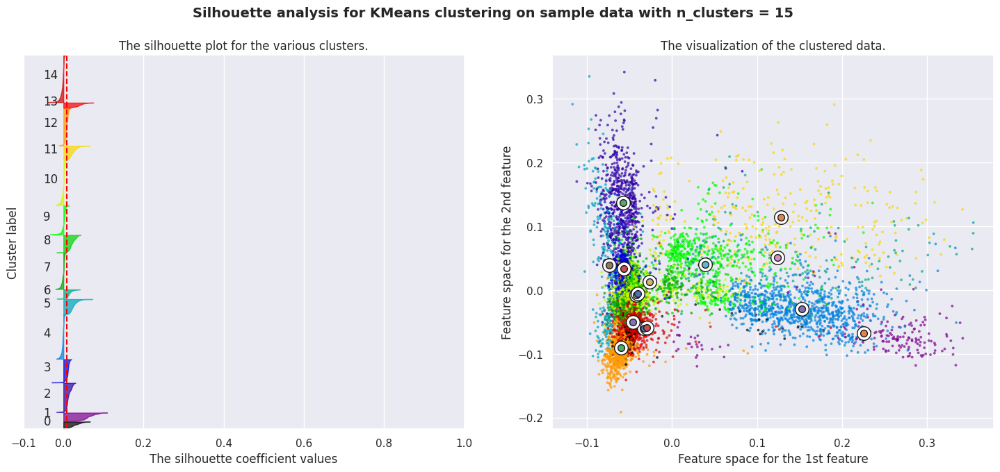

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

range_n_clusters = [i for i in range(2,16)]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X_transformed) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X_transformed)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_transformed, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_transformed, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) /n_clusters)
    ax2.scatter(X_transformed[:, 0], X_transformed[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")
    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

#3. Dendrogram for K-means

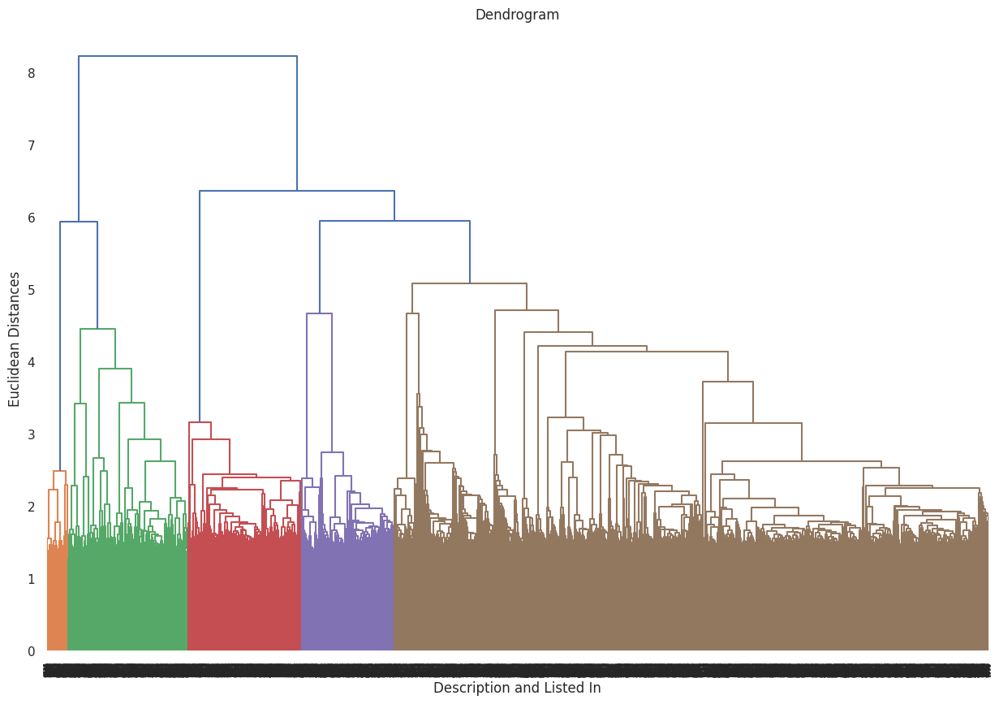

In [ ]:
from pylab import rcParams
rcParams['figure.figsize'] = 15, 10

# Using the dendrogram to find the optimal number of clusters
import scipy.cluster.hierarchy as sch

plt.figure(figsize=(15, 10))  # Adjust the figure size
dendrogram = sch.dendrogram(sch.linkage(X_transformed, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Description and Listed In')
plt.ylabel('Euclidean Distances')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.show()

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

We looked at a special chart called a dendrogram to find the best number of groups for a technique called K-means. In this chart, we found the longest vertical line that doesn't touch any other horizontal lines. We drew a line through this distance and counted how many other lines it crossed. We discovered that the best number of groups for K-means, according to the dendrogram, is 15 clusters.

#K-means Clustering with 18 clusters

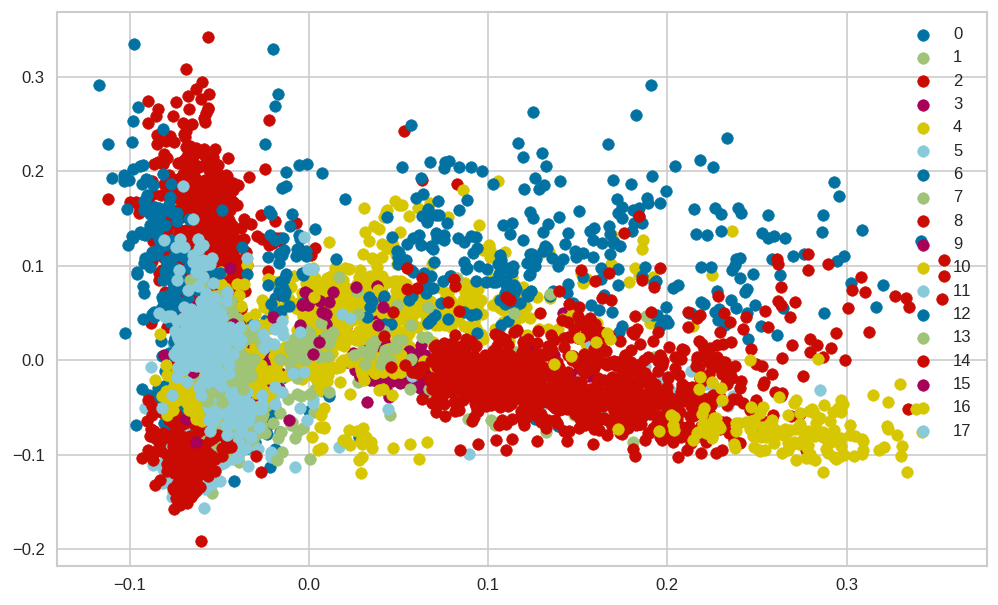

In [ ]:
from sklearn.cluster import KMeans

from yellowbrick.cluster import KElbowVisualizer
plt.figure(figsize=(10,6), dpi=120)

kmeans= KMeans(n_clusters=18, init= 'k-means++', random_state=9)
kmeans.fit(X_transformed)

# Here we are predicting the labels of clusters.
label = kmeans.fit_predict(X_transformed)
# Let's check the unique labels
unique_labels = np.unique(label)

# function to plot the result
for i in unique_labels:
    plt.scatter(X_transformed[label == i , 0] , X_transformed[label == i , 1] , label = i)
plt.legend()
plt.show()

#K-means Clustering with 15 clusters.

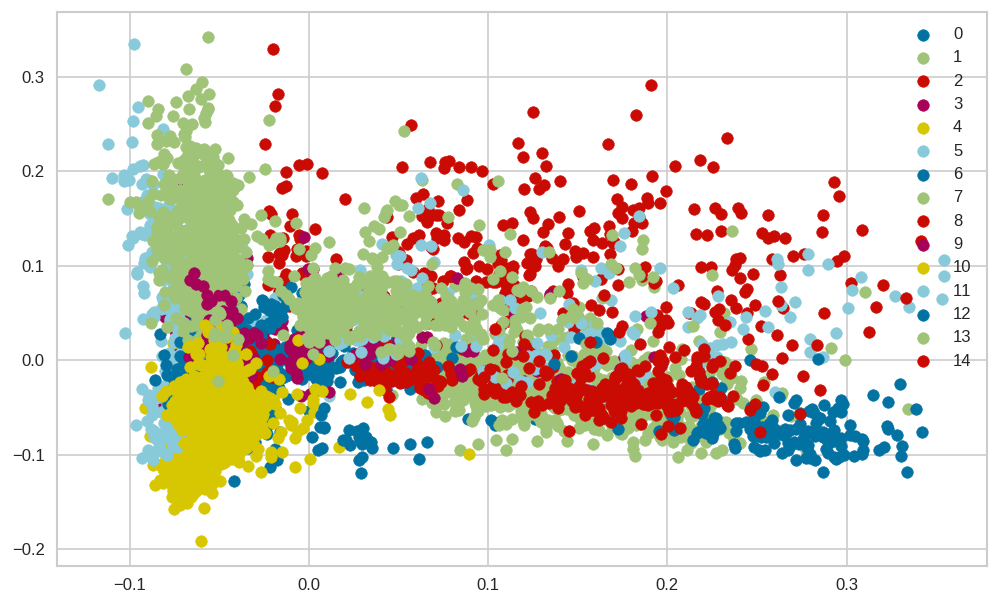

In [ ]:


from sklearn.cluster import KMeans

from yellowbrick.cluster import KElbowVisualizer
plt.figure(figsize=(10,6), dpi=120)

kmeans= KMeans(n_clusters=15, init= 'k-means++', random_state=9)
kmeans.fit(X_transformed)

# Predicting the labels of clusters.
label = kmeans.fit_predict(X_transformed)
# let's check all the unique labels
unique_labels = np.unique(label)

# function to plot the result
for i in unique_labels:
    plt.scatter(X_transformed[label == i , 0] , X_transformed[label == i , 1] , label = i)
plt.legend()
plt.show()

# Hierarchical Clustering:


Hierarchical Clustering is a type of clustering algorithm used in unsupervised machine learning. It aims to group similar data points into clusters based on their similarities, forming a tree-like structure known as a dendrogram. The algorithm works by iteratively merging or splitting clusters based on the distance between data points.

#Agglomerative Clustering

In [ ]:
# Importing agglomerative clustering
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 15, affinity = 'euclidean', linkage = 'ward')
y_hc = hc.fit_predict(X_transformed)

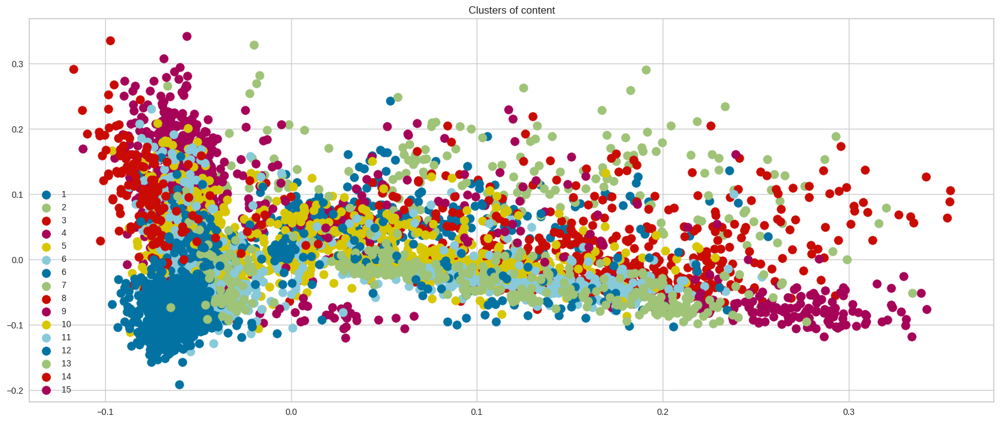

In [ ]:
# Here visualizing the clusters in three dimensions.
plt.figure(figsize=(20,8))
plt.scatter(X_transformed[y_hc == 0, 0], X_transformed[y_hc == 0, 1], s = 100, label = '1')
plt.scatter(X_transformed[y_hc == 1, 0], X_transformed[y_hc == 1, 1], s = 100, label = '2')
plt.scatter(X_transformed[y_hc == 2, 0], X_transformed[y_hc == 2, 1], s = 100, label = '3')
plt.scatter(X_transformed[y_hc == 3, 0], X_transformed[y_hc == 3, 1], s = 100, label = '4')
plt.scatter(X_transformed[y_hc == 4, 0], X_transformed[y_hc == 4, 1], s = 100, label = '5')
plt.scatter(X_transformed[y_hc == 5, 0], X_transformed[y_hc == 5, 1], s = 100, label = '6')
plt.scatter(X_transformed[y_hc == 6, 0], X_transformed[y_hc == 6, 1], s = 100, label = '6')
plt.scatter(X_transformed[y_hc == 7, 0], X_transformed[y_hc == 7, 1], s = 100, label = '7')
plt.scatter(X_transformed[y_hc == 8, 0], X_transformed[y_hc == 8, 1], s = 100, label = '8')
plt.scatter(X_transformed[y_hc == 9, 0], X_transformed[y_hc == 9, 1], s = 100, label = '9')
plt.scatter(X_transformed[y_hc == 10, 0], X_transformed[y_hc == 10, 1], s = 100, label = '10')
plt.scatter(X_transformed[y_hc == 11, 0], X_transformed[y_hc == 11, 1], s = 100, label = '11')
plt.scatter(X_transformed[y_hc == 12, 0], X_transformed[y_hc == 12, 1], s = 100, label = '12')
plt.scatter(X_transformed[y_hc == 13, 0], X_transformed[y_hc == 13, 1], s = 100, label = '13')
plt.scatter(X_transformed[y_hc == 14, 0], X_transformed[y_hc == 14, 1], s = 100, label = '14')
plt.scatter(X_transformed[y_hc == 15, 0], X_transformed[y_hc == 15, 1], s = 100, label = '15')
plt.title('Clusters of content')

plt.legend()
plt.show()

#Let's Create a Recommendation System for the above Clusters

In [ ]:
# Adding the cluster values to the dateframe
data['cluster_number'] = kmeans.labels_

### We gave preference to K-means Cluster for the Recommendation System

In [ ]:
# Here we imported path,Image,WordCloud,STOPWORDS,ImageColorGenerator
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [ ]:
# Filtering the dataframe by cluster number and selected column
def func_select_Category(category_name,column_of_choice):
  df_word_cloud = data[['cluster_number',column_of_choice]].dropna()
  df_word_cloud = df_word_cloud[df_word_cloud['cluster_number']==category_name]
  # Concatenating the words in the selected column
  text = " ".join(word for word in df_word_cloud[column_of_choice])
   # Setting the stopwords and generate word cloud
  stopwords = set(STOPWORDS)
  # Generating the word cloud image
  wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
  # Code to display the word cloud
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.title(f'Cluster: {i}')
  plt.axis("off")
  plt.show()

In [ ]:
data.head(5)

,Filtered_data,length_of_text,cluster_number
title,,,
3%,futur elit inhabit island paradis far crowd sl...,294,1
7:19,devast earthquak hit mexico citi trap survivor...,203,10
23:59,armi recruit found dead fellow soldier forc co...,241,10
9,postapocalypt world ragdol robot hide fear dan...,277,6
21,brilliant group student becom cardcount expert...,267,6


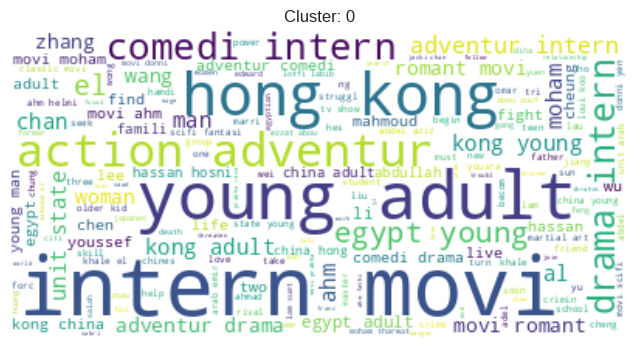

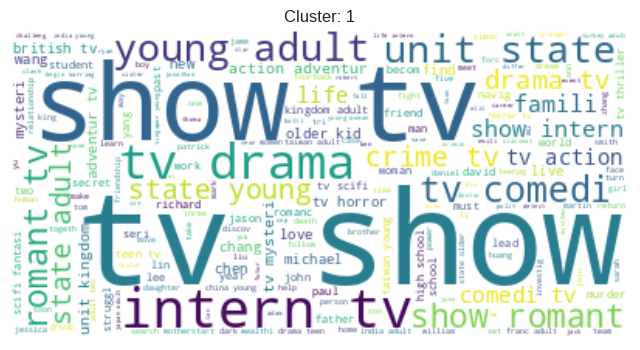

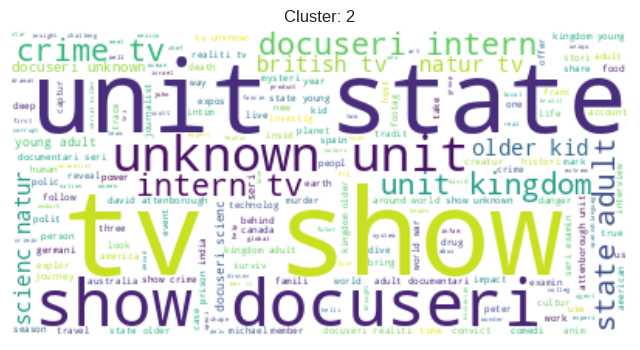

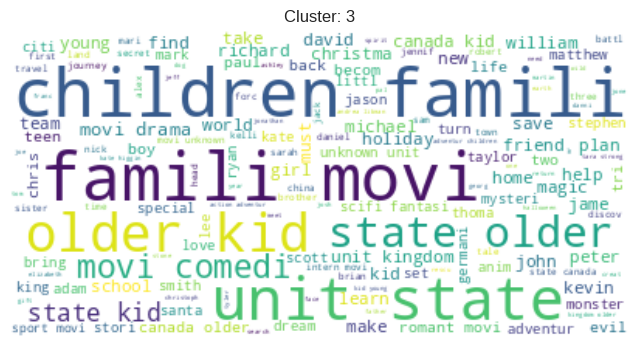

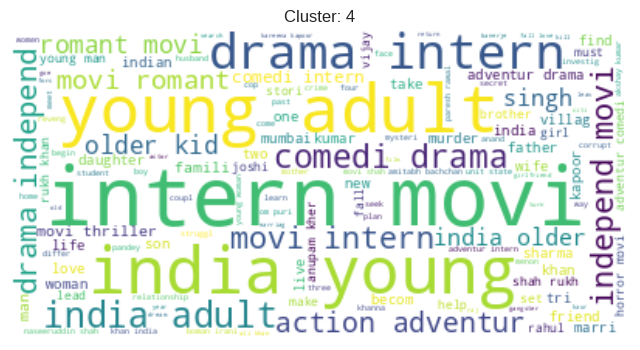

...

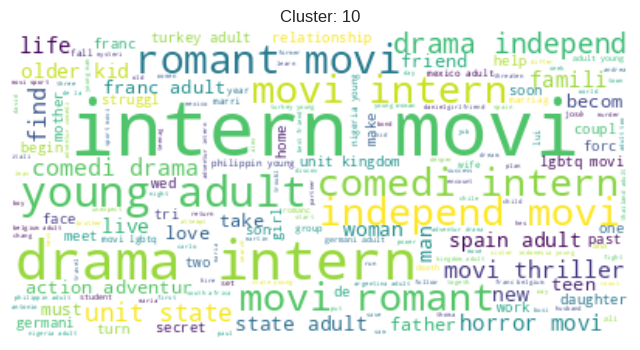

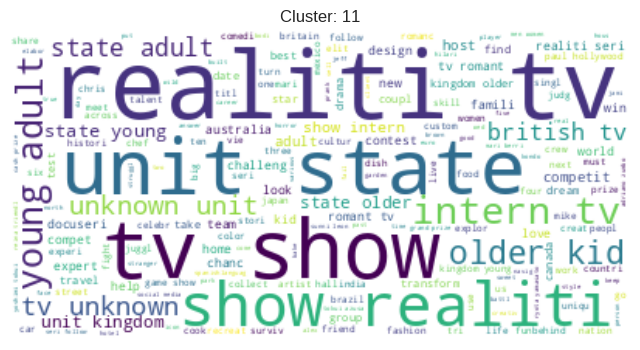

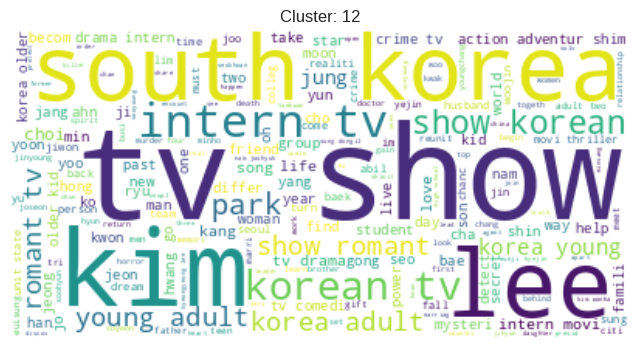

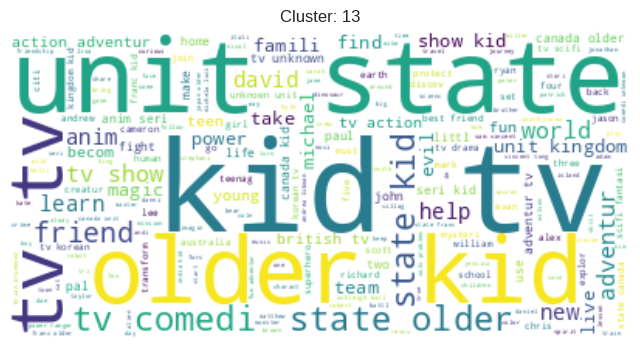

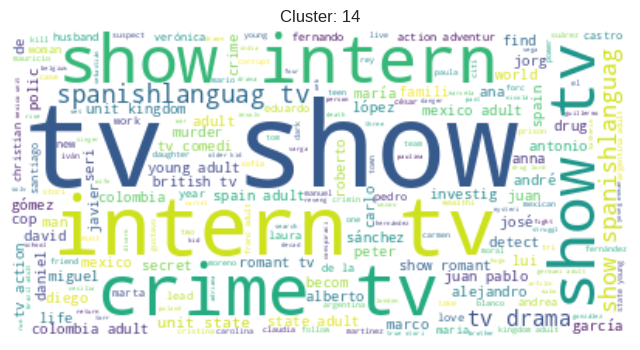

In [ ]:
for i in range(15):
  func_select_Category(i,'Filtered_data')

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
# Calculating the cosine similarity matrix
cosine_sim = cosine_similarity(X, X)
cosine_sim

array([[1.        , 0.03849922, 0.02661087, ..., 0.00432406, 0.02732161,
        0.0020306 ],
       [0.03849922, 1.        , 0.00830409, ..., 0.0588523 , 0.00250009,
        0.00230539],
       [0.02661087, 0.00830409, 1.        , ..., 0.0098769 , 0.00233186,
        0.00215025],
       ...,
       [0.00432406, 0.0588523 , 0.0098769 , ..., 1.        , 0.00297361,
        0.24626546],
       [0.02732161, 0.00250009, 0.00233186, ..., 0.00297361, 1.        ,
        0.03068029],
       [0.0020306 , 0.00230539, 0.00215025, ..., 0.24626546, 0.03068029,
        1.        ]])

In [ ]:
indices = pd.Series(data.index)
indices[:5]

0       3%
1     7:19
2    23:59
3        9
4       21
Name: title, dtype: object

In [ ]:
# Function to generates recommendations based on a movie title
def recommendations(Title, cosine_sim = cosine_sim):

    recommended_movies = []

    # Finding the index of the movie that matches the title
    idx = indices[indices == Title].index[0]

    # Sorting the cosine similarity scores in descending order
    score_series = pd.Series(cosine_sim[idx]).sort_values(ascending = False)

    # Retrieve the indexes of the 10 most similar movies
    top_10_indexes = list(score_series.iloc[1:11].index)

    # Populate the list with the titles of the top 10 recommended movies
    for i in top_10_indexes:
        recommended_movies.append(list(data.index)[i])

    return recommended_movies

In [ ]:
# Iterate over a range of indices from 0 to 499
# Retrieve the movie title at index i
for i in range(0, 500):
  gg = df['title'].iloc[i]
  print(gg)

3%
7:19
23:59
9
21
46
122
187
706
1920
1922
1983
1994
2,215
3022
Oct-01
Feb-09
22-Jul
15-Aug
'89
​​Kuch Bheege Alfaaz
​Goli Soda 2
​Maj Rati ​​Keteki
​Mayurakshi
​SAINT SEIYA: Knights of the Zodiac
(T)ERROR
(Un)Well
#Alive
#AnneFrank - Parallel Stories
#blackAF
#cats_the_mewvie
#FriendButMarried
#FriendButMarried 2
#realityhigh
#Roxy
#Rucker50
#Selfie
#Selfie 69
แผนร้ายนายเจ้าเล่ห์
¡Ay, mi madre!
Çarsi Pazar
Ég man þig
Çok Filim Hareketler Bunlar
Òlòtūré
Æon Flux
Şubat
1 Chance 2 Dance
1 Mile to You
10 Days in Sun City
10 jours en or
10,000 B.C.
100 Days My Prince
100 Days Of Solitude
100 Humans
100 Meters
100 Things to do Before High School
100 Years: One Woman's Fight for Justice
100% Halal
100% Hotter
1000 Rupee Note
12 ROUND GUN
12 Years Promise
13 Cameras
13 Reasons Why
13 Reasons Why: Beyond the Reasons
13 Sins
13TH
14 Blades
14 Cameras
14 Minutes from Earth
16 Blocks
17 Again
18 Presents
1898: Our Last Men in the Philippines
1BR
1st Summoning
2 Alone in Paris
2 States
20 Feet Fr

In [ ]:

# Generating the movie recommendations based on the movie 'American Psycho'
movie_recommendations = pd.DataFrame(recommendations('American Psycho'), columns=['Recommendations'])
movie_recommendations



,Recommendations
0,Shine On with Reese
1,Love Is Blind
2,Death Note
3,My Scientology Movie
4,How to Make an American Quilt
5,The Good Cop
6,Zodiac
7,Rain Man
8,A Family Man
9,Lucas Brothers: On Drugs


In [ ]:
#  Generating TV show recommendations based on the TV show 'Stranger Things'
tvshows_recommendations = pd.DataFrame(recommendations('Stranger Things'), columns=['Recommendations'])
tvshows_recommendations.head(11)

,Recommendations
0,Beyond Stranger Things
1,Prank Encounters
2,The Umbrella Academy
3,Reckoning
4,Anjaan: Special Crimes Unit
5,Sleepless Society: Nyctophobia
6,The OA
7,Kiss Me First
8,The 4400
9,Eli


# **Conclusion**

* United States and India are among the top 5 countries that produce all of the available content on the platform.
* Majority of the content available on Netflix is Movies.
* The most common ratings for both movies and TV shows on Netflix are TV-MA and TV-14.
* Using the Elbow approach, we chose 18 clusters.
* The years 2015-2019 witnessed the highest production of movies and TV shows.
* Most of these contents are released either in the year ending or the beginning.
* We then used KMeans to predict the labels on our data.
* The most common genre of content on Netflix is Dramas, followed by Comedies and Documentries.